1. Loading Data...

2. Starting 3x3 Training (Hidden Dim vs Block Size)...
  > Training B=4x4 (In=16), H=4
  > Training B=4x4 (In=16), H=16
Skipping B=4x4, H=32 (Hidden > Input)
  > Training B=8x8 (In=64), H=4
  > Training B=8x8 (In=64), H=16
  > Training B=8x8 (In=64), H=32
  > Training B=16x16 (In=256), H=4
  > Training B=16x16 (In=256), H=16
  > Training B=16x16 (In=256), H=32

3. Starting Momentum Comparison Training (B=8x8, H=16)...
    Momentum ON Trained.
    Momentum OFF Trained.

4. Generating ALL Reconstructions for ALL Test Images...

--- VISUALIZING Test Image 1/5 ---


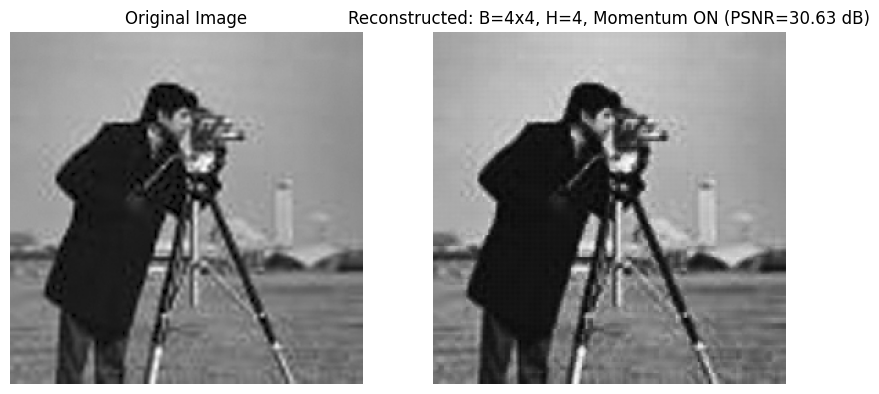

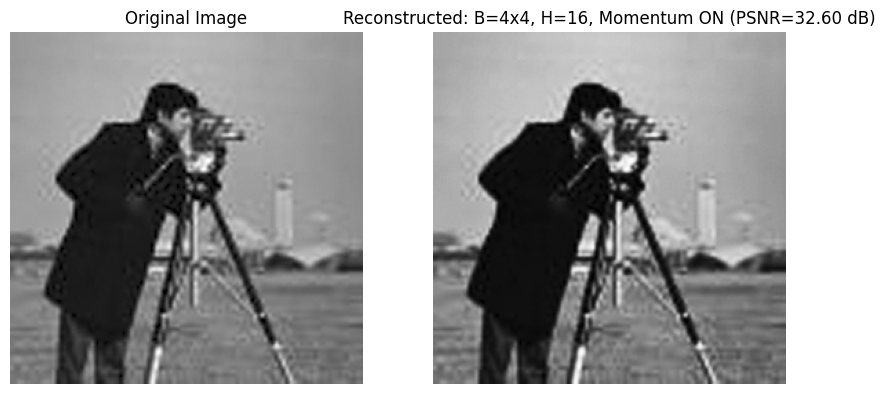

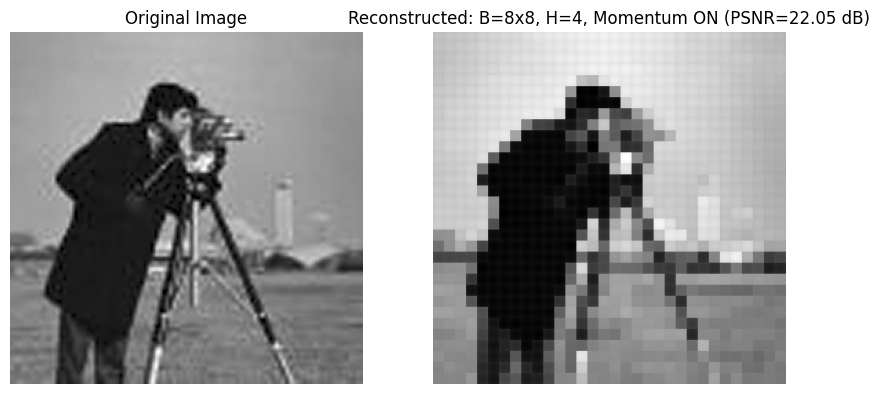

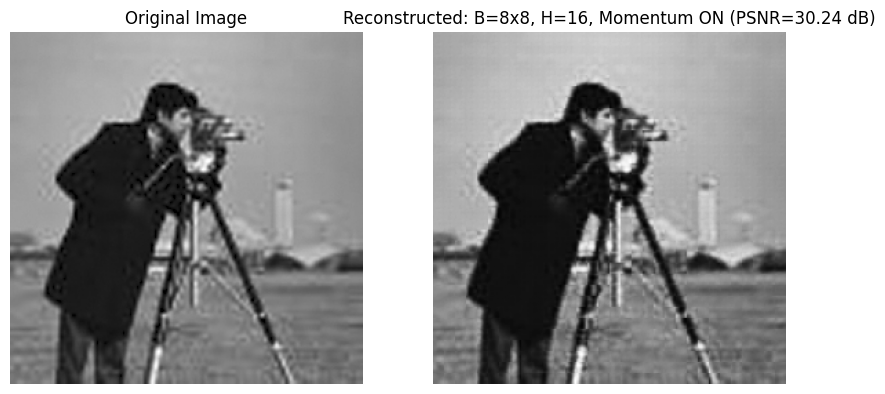

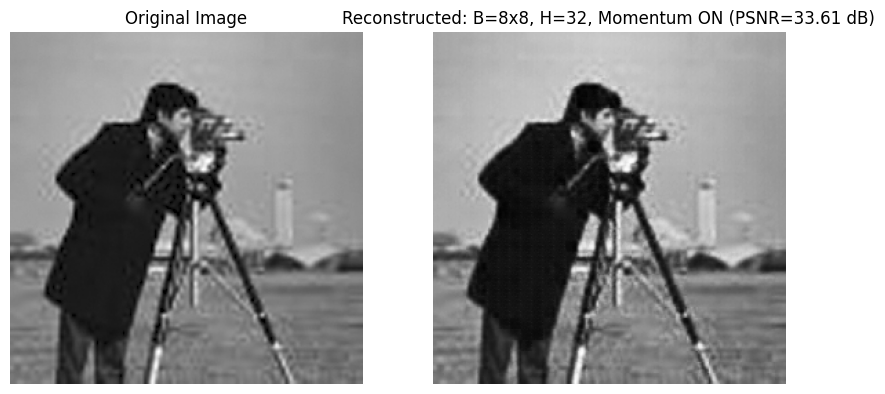

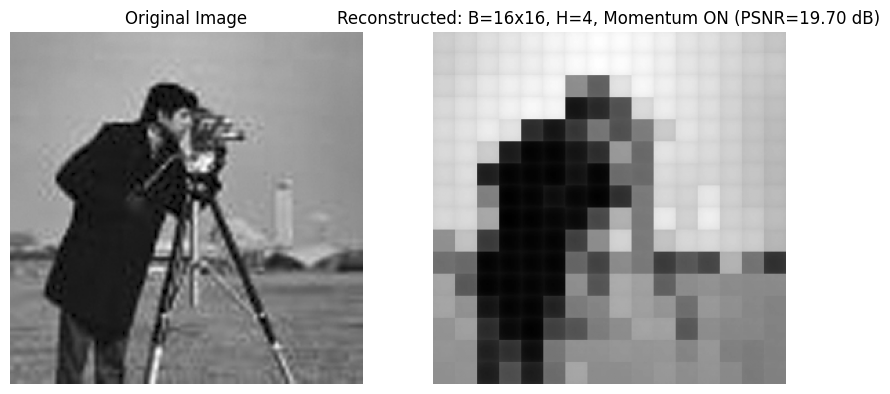

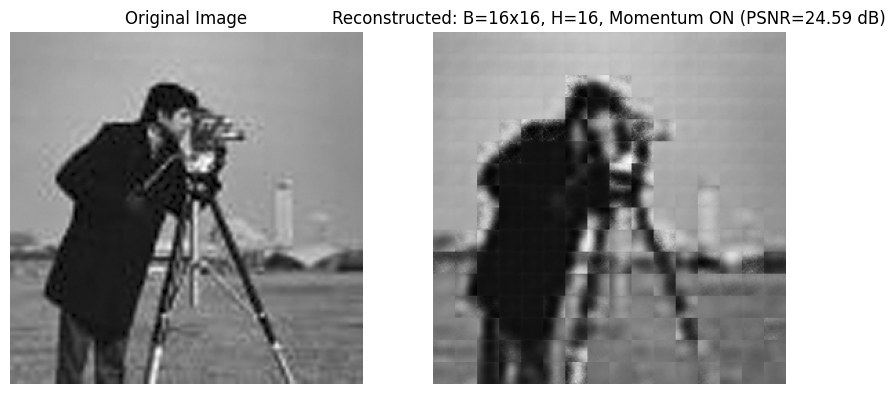

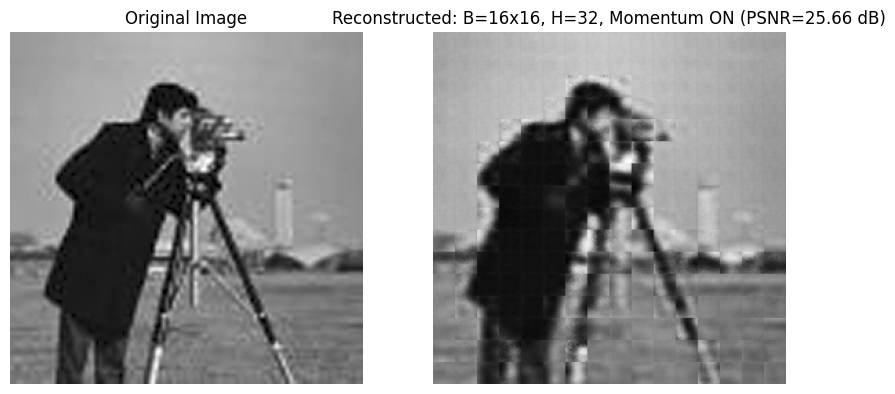

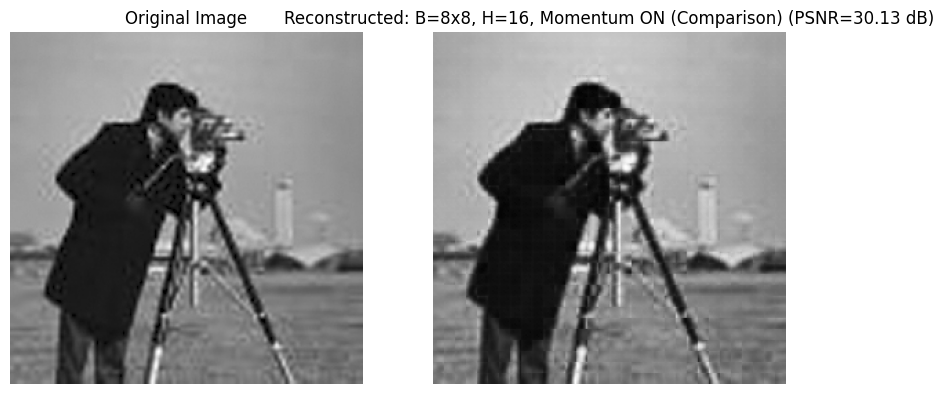

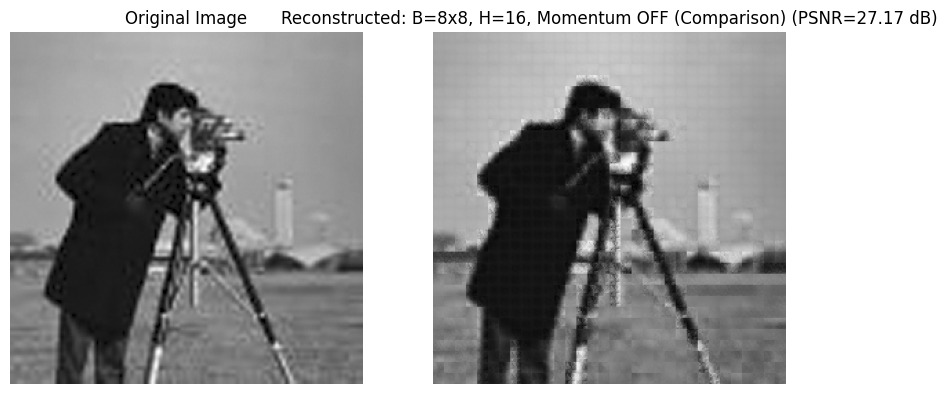


--- VISUALIZING Test Image 2/5 ---


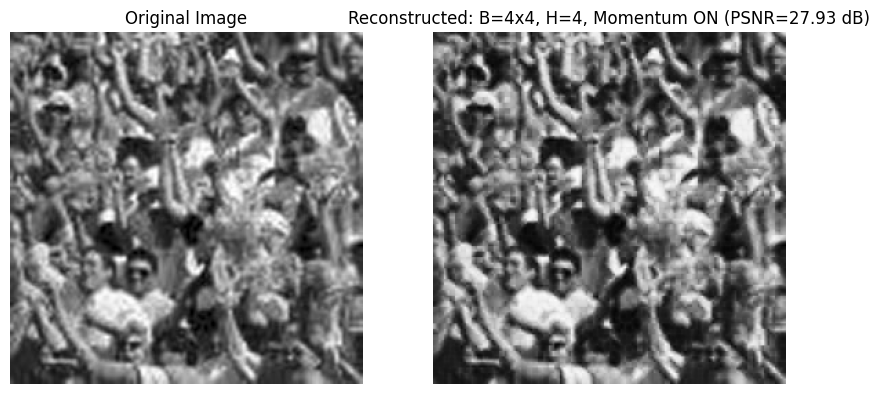

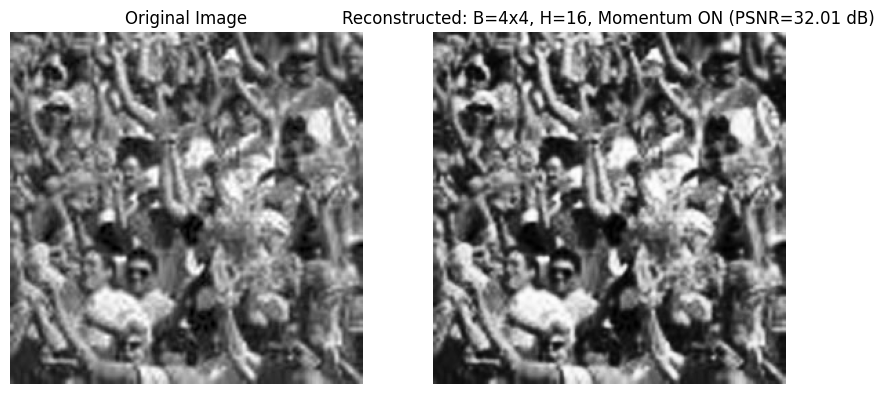

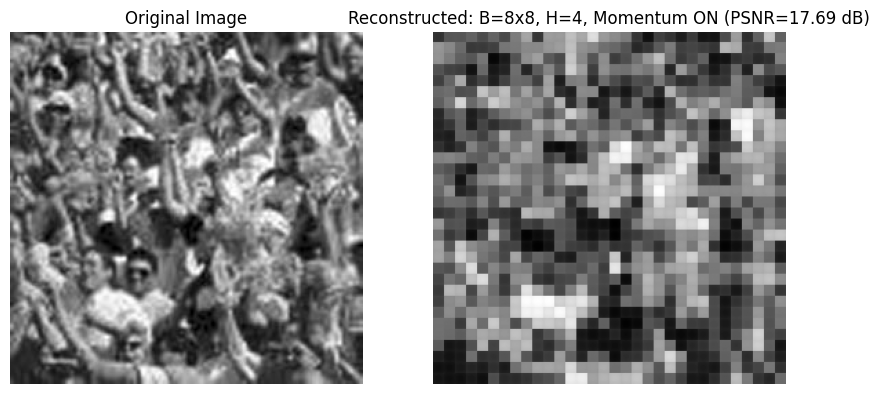

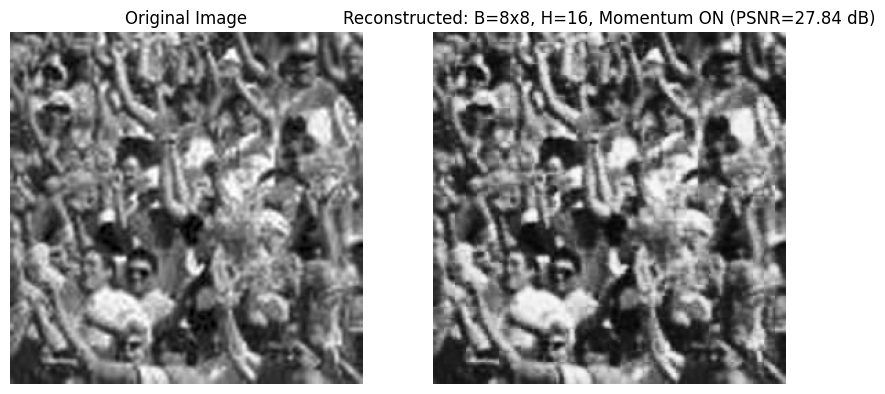

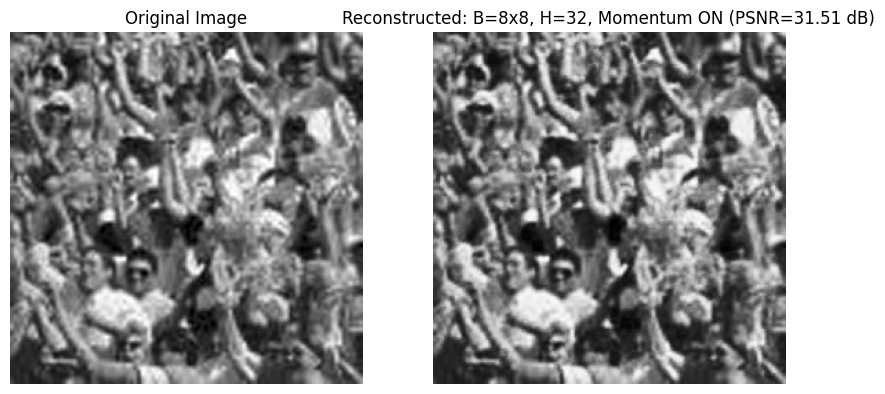

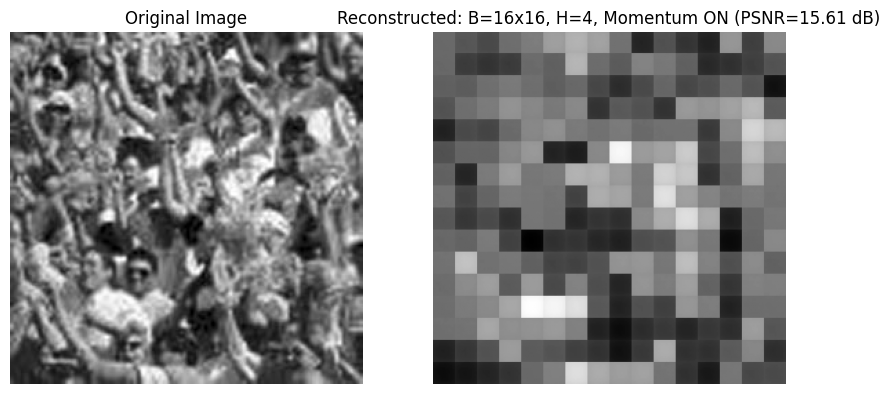

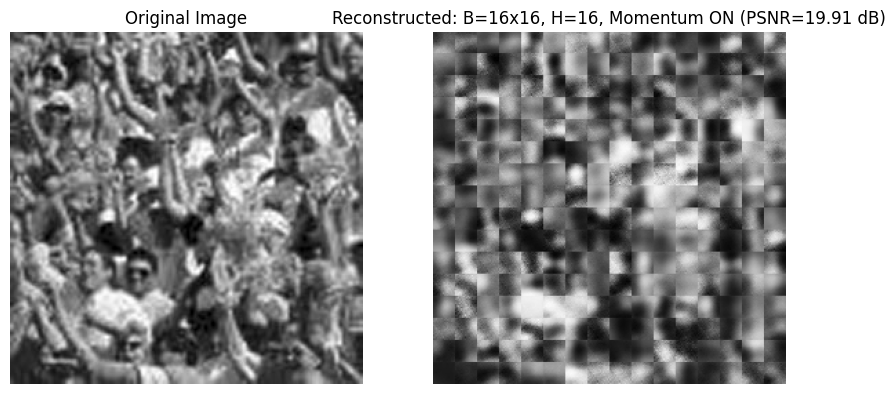

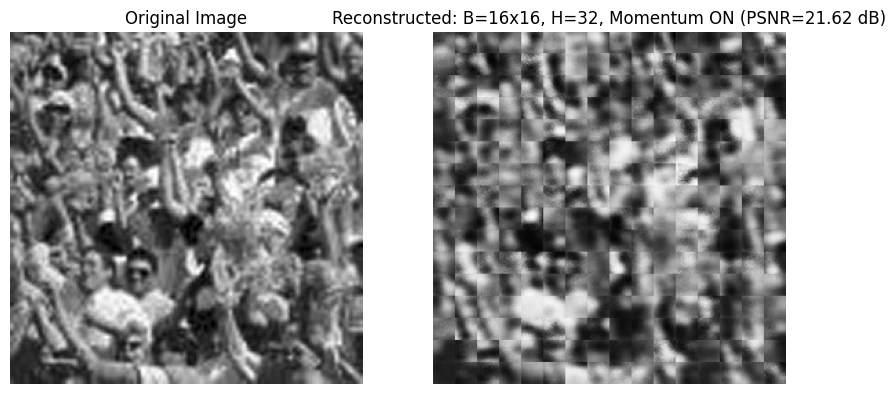

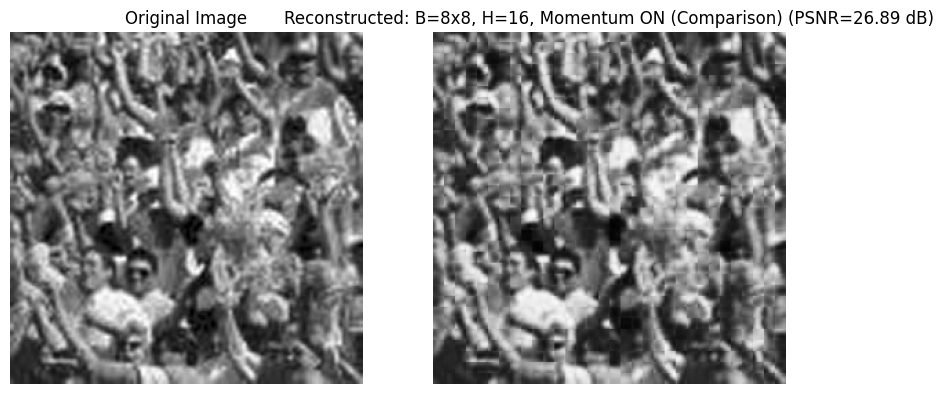

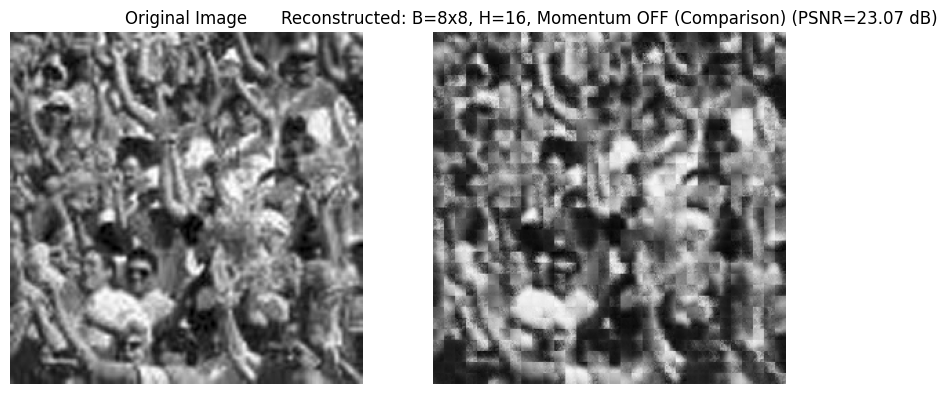


--- VISUALIZING Test Image 3/5 ---


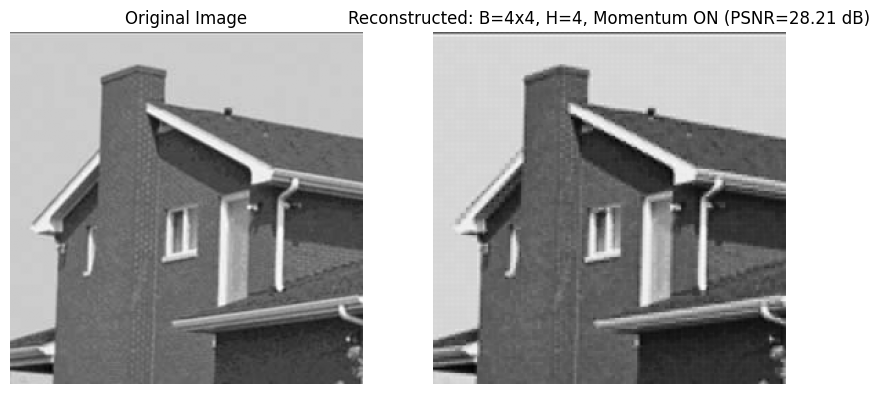

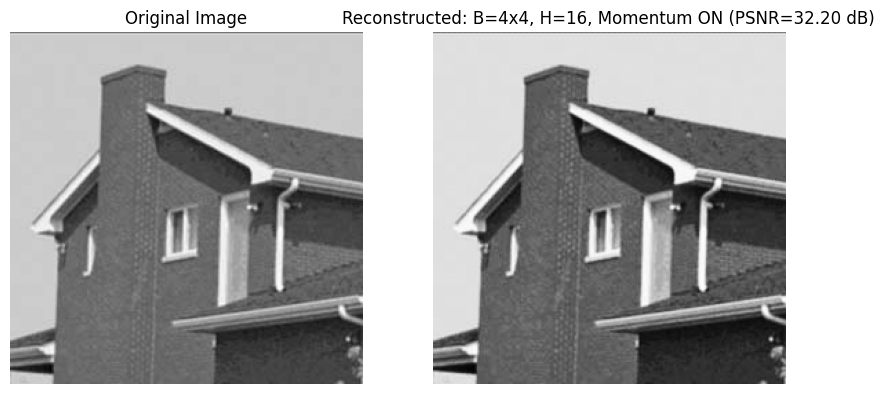

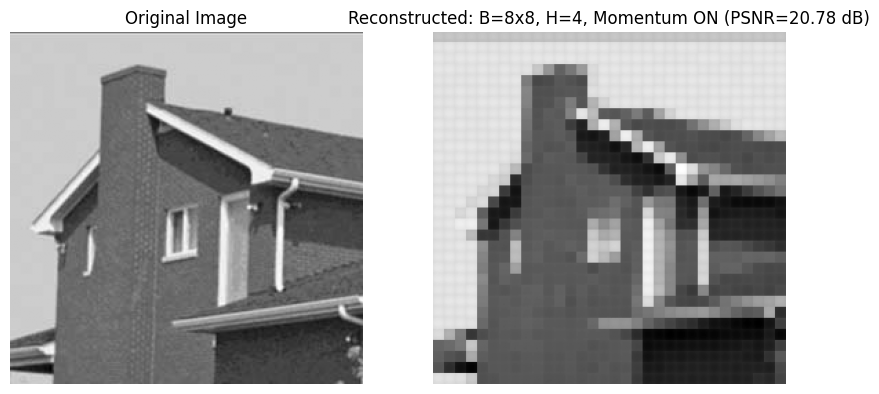

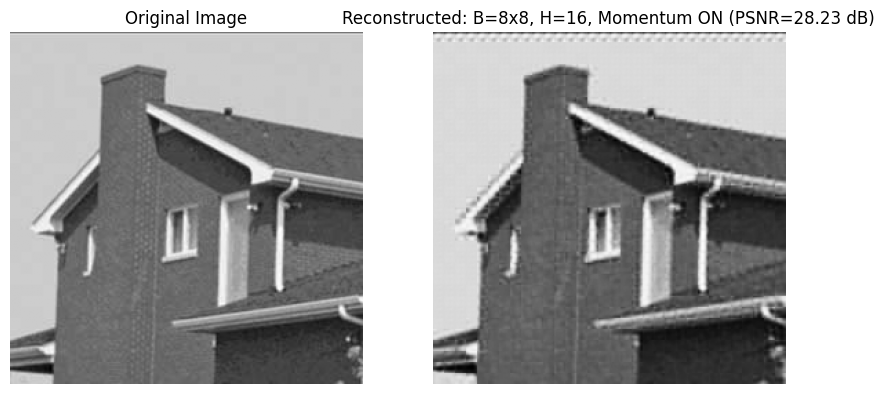

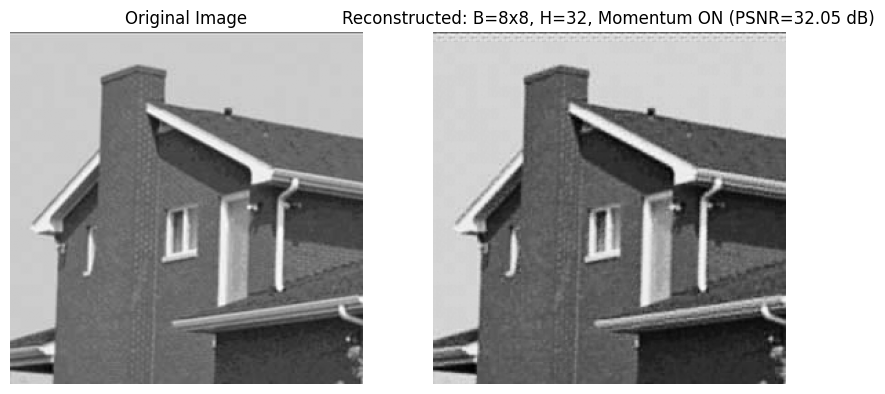

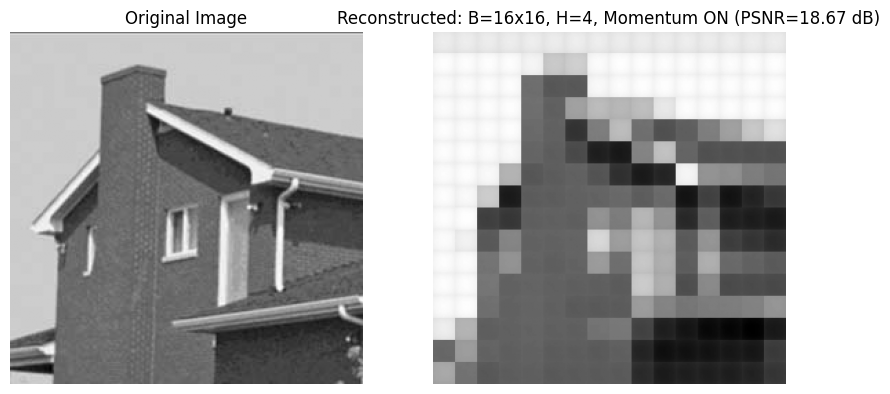

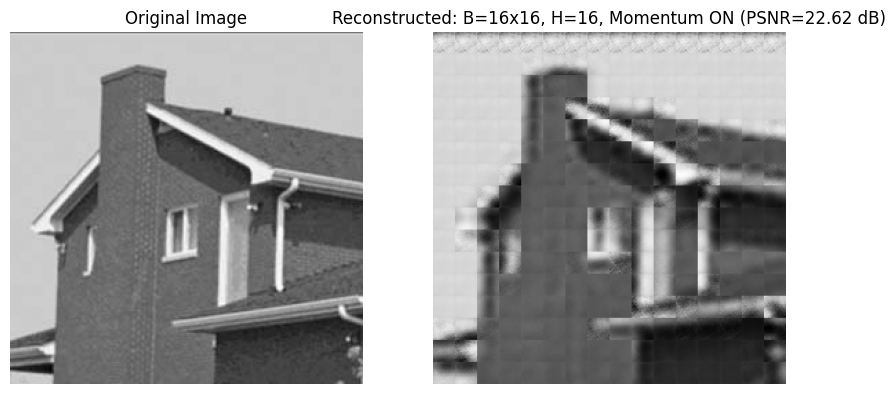

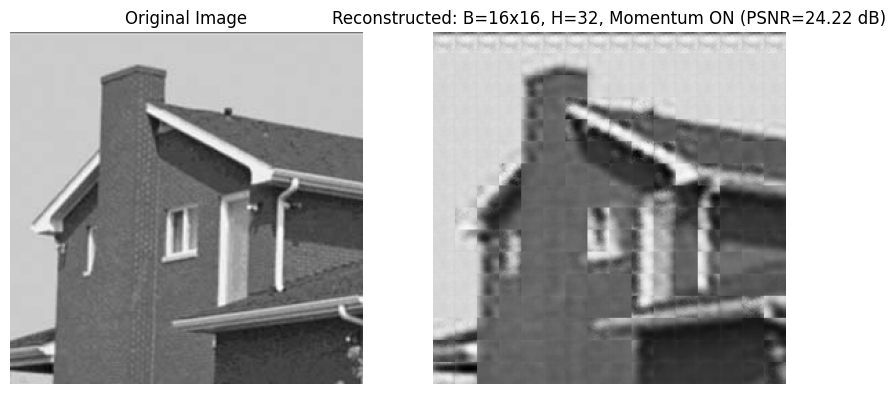

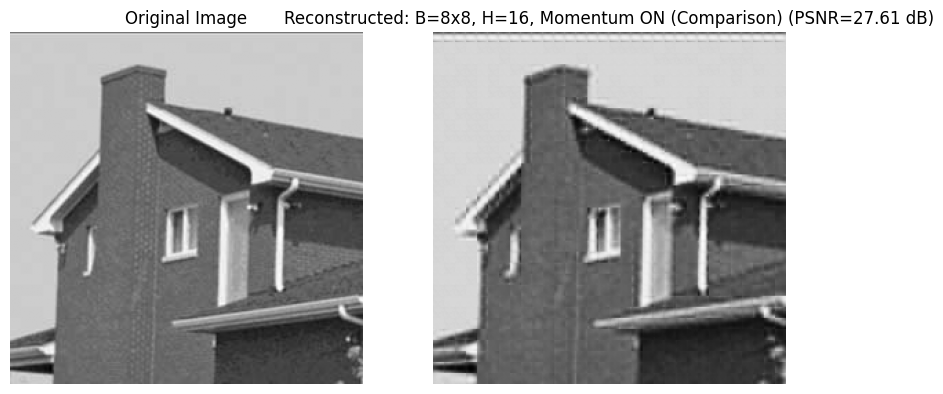

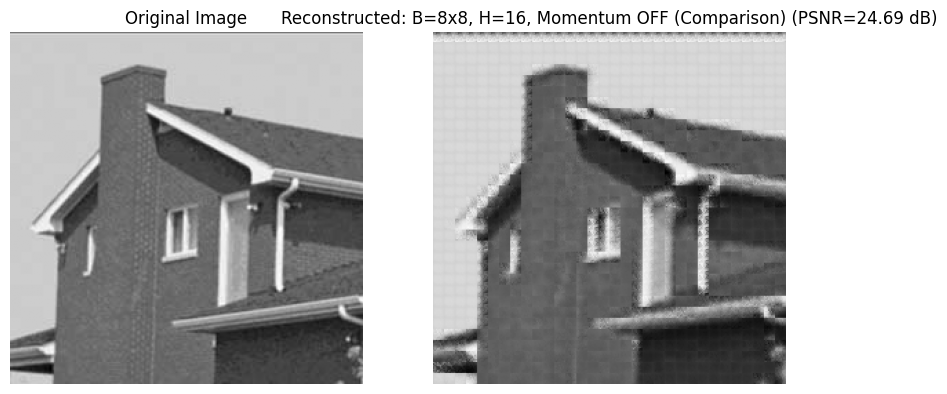


--- VISUALIZING Test Image 4/5 ---


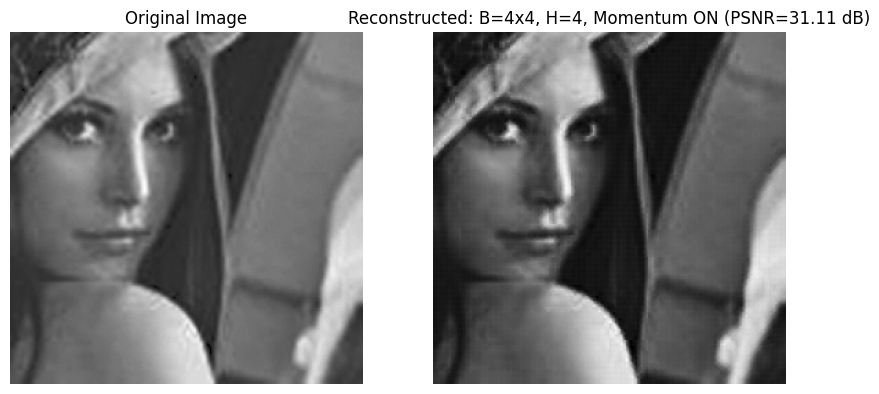

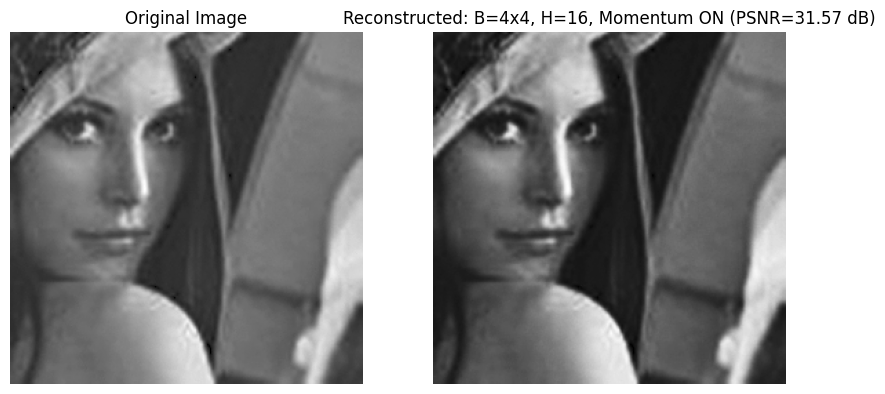

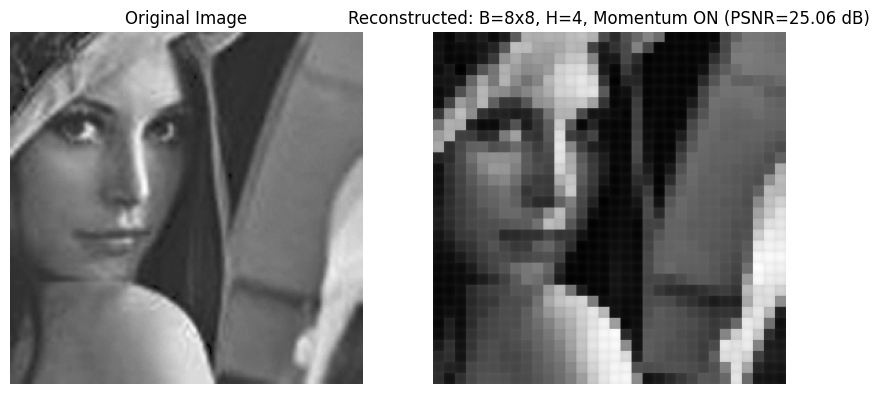

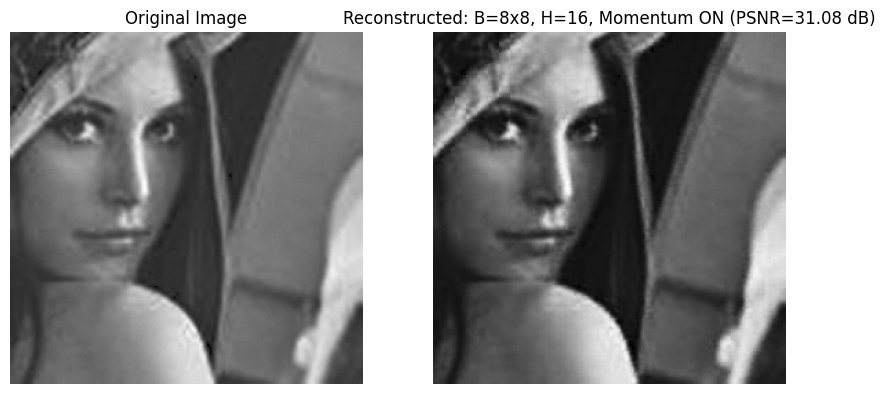

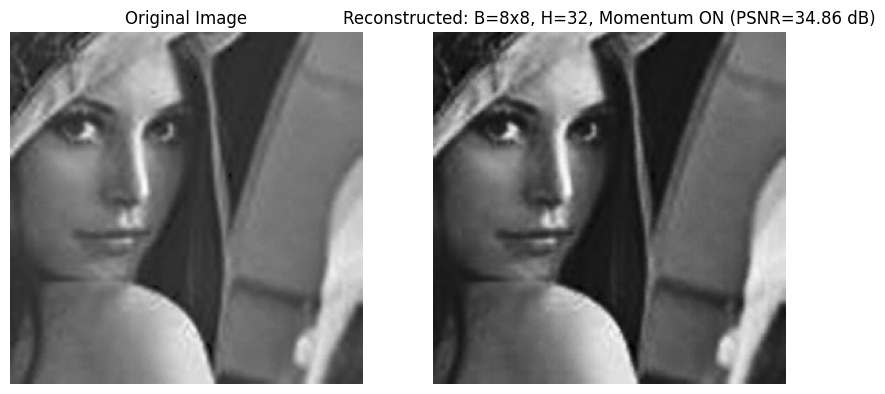

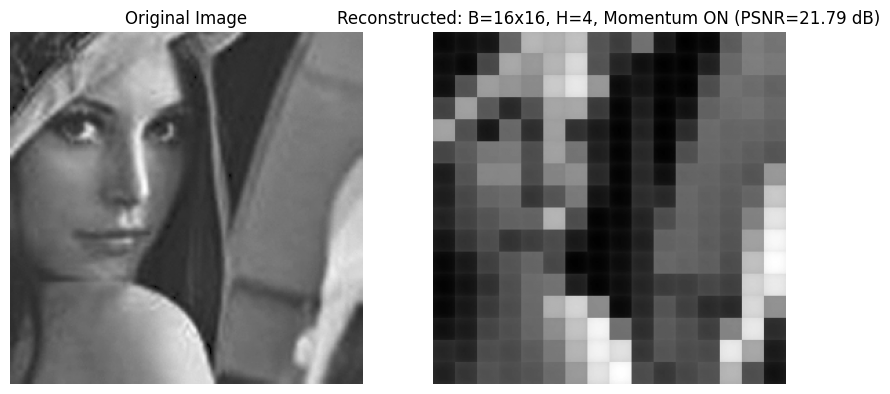

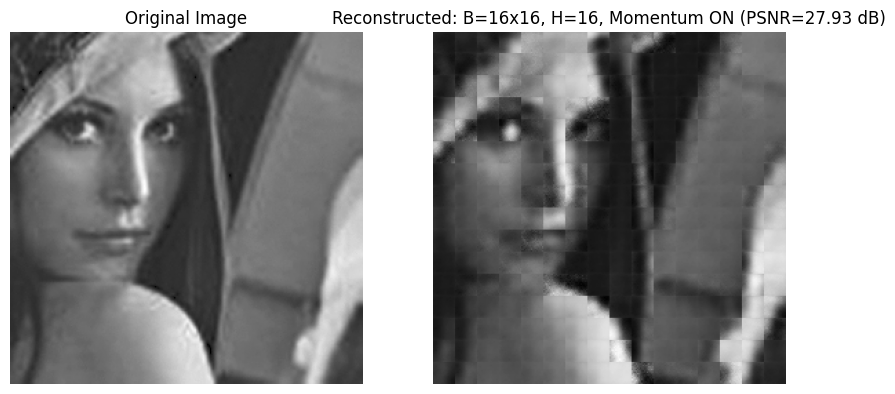

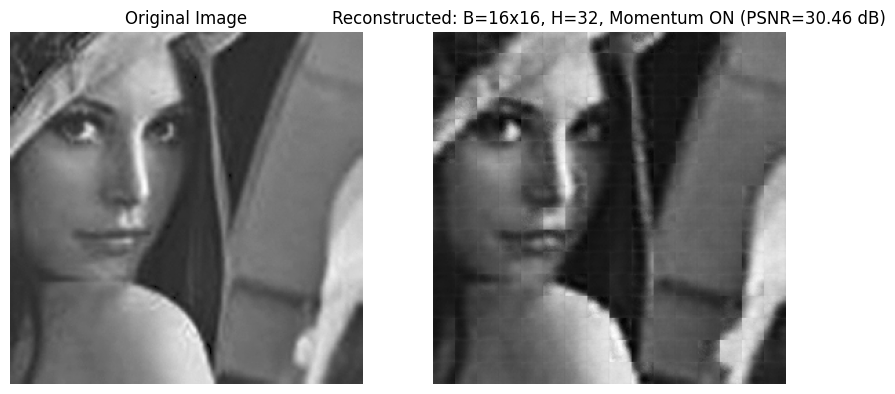

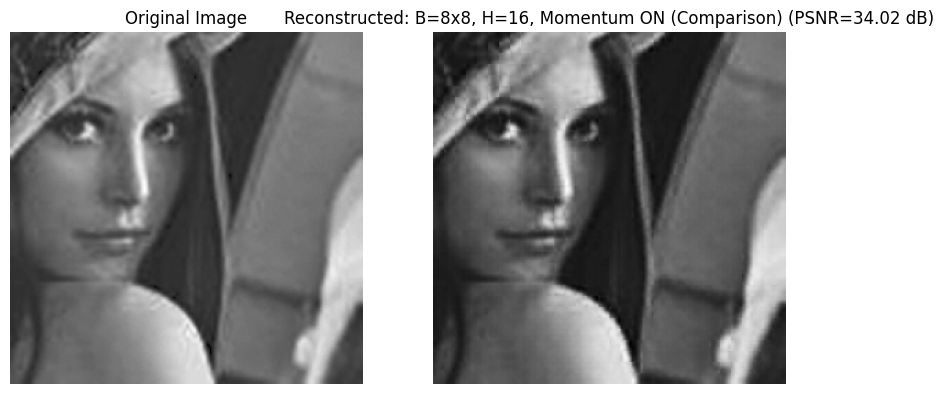

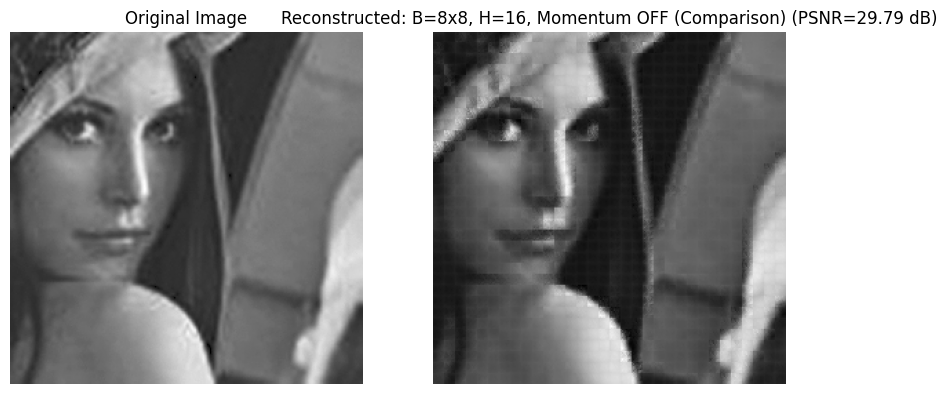


--- VISUALIZING Test Image 5/5 ---


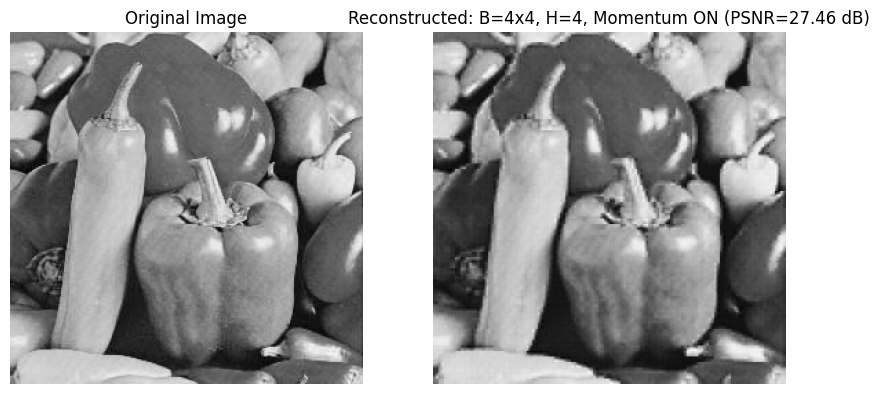

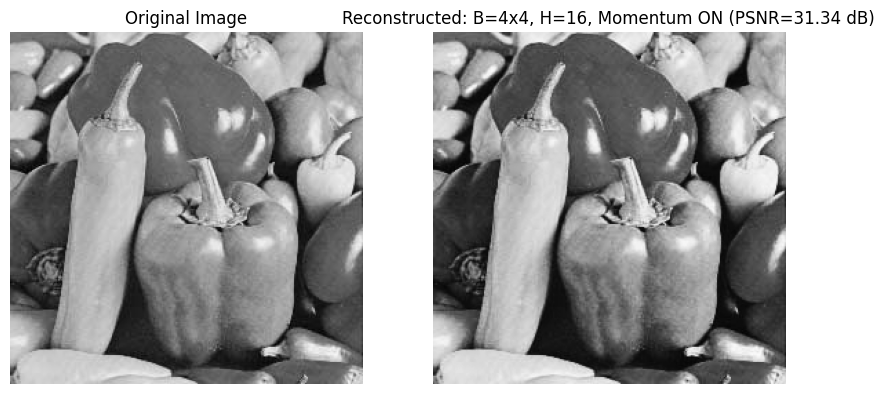

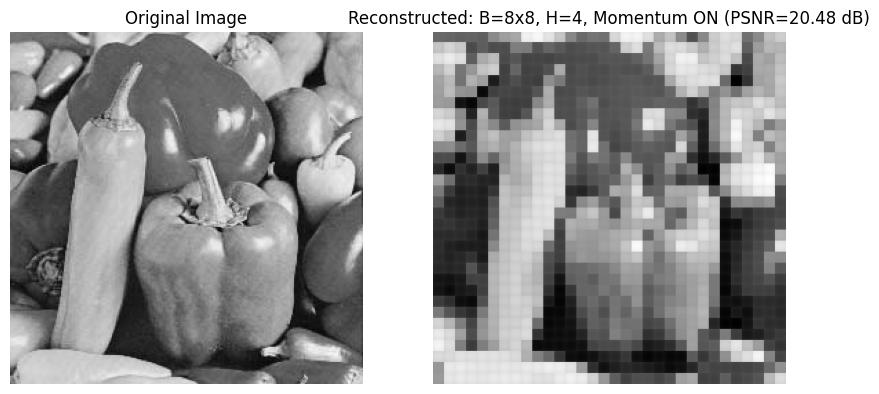

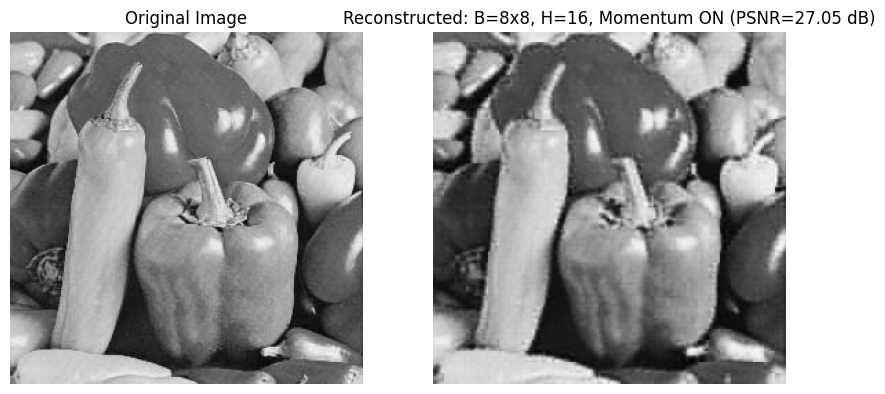

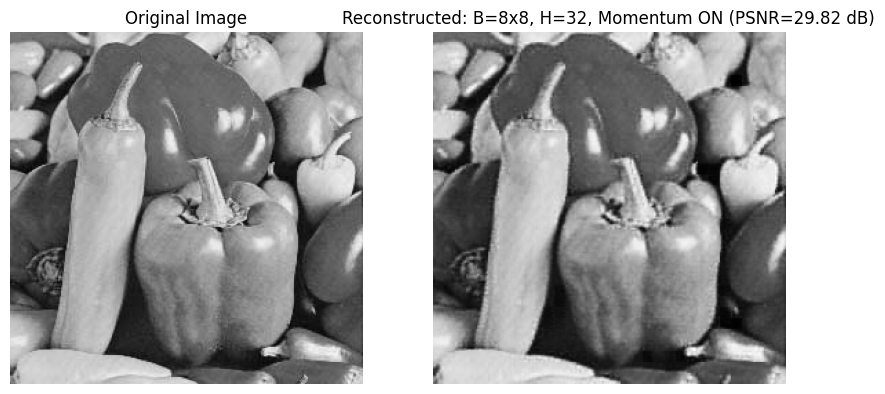

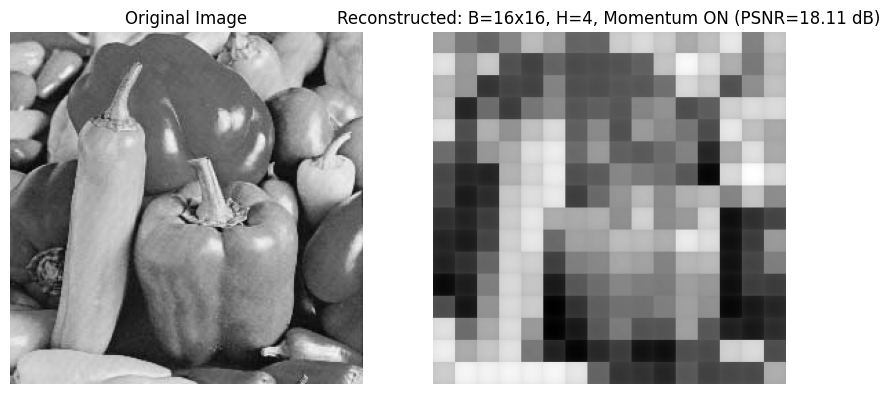

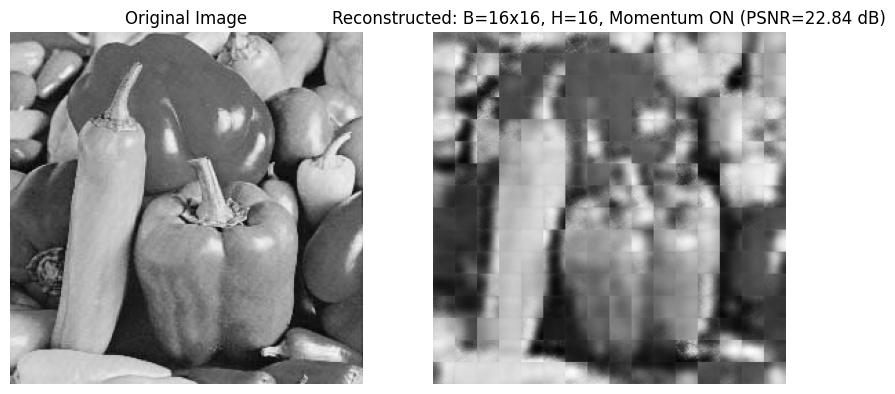

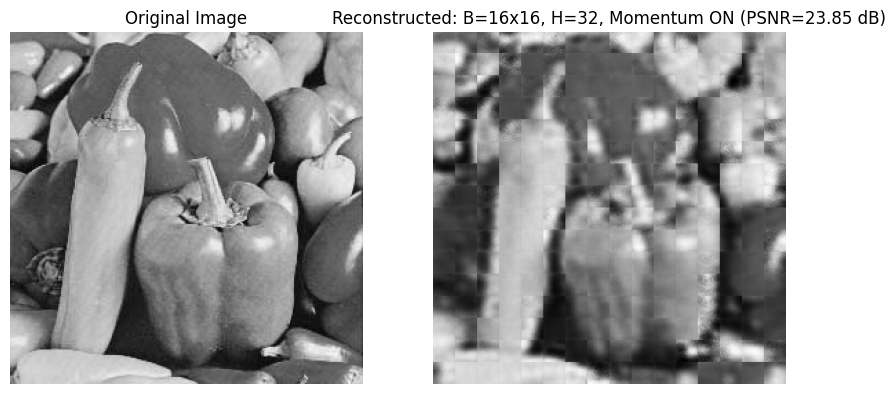

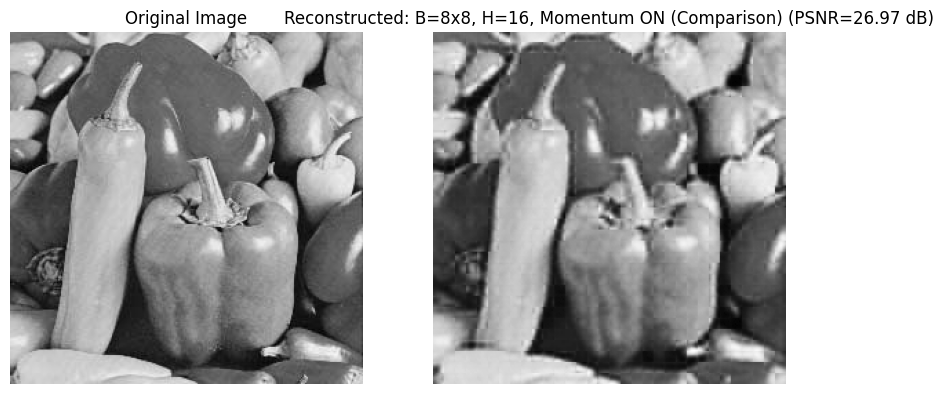

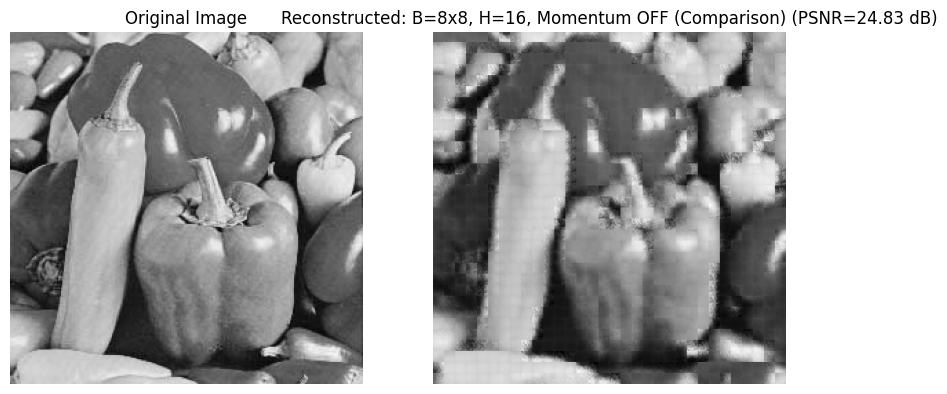


...Visualization Complete.


In [1]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from pprint import pprint

# ===============================
# توابع کمکی اولیه
# ===============================

def load_images(folder):
    """Loads all images from a folder, converts to grayscale and numpy array."""
    imgs = []
    # NOTE: This assumes 'TrainSet' and 'TestSet' folders exist in the execution environment
    try:
        for fname in os.listdir(folder):
            path = os.path.join(folder, fname)
            # Skip directories or non-image files if they exist
            if os.path.isdir(path):
                continue
            
            # Use a try block in case some files are not images
            try:
                img = Image.open(path).convert("L")
                imgs.append(np.array(img, dtype=np.float32))
            except Exception as e:
                print(f"Skipping file {fname} due to error: {e}")
    except FileNotFoundError:
        print(f"Error: Directory '{folder}' not found. Ensure your data folders are correctly set up.")
        return []
    return imgs

def extract_blocks(img, block=8):
    """Extracts non-overlapping blocks from an image."""
    H, W = img.shape
    blocks = []
    for i in range(0, H, block):
        for j in range(0, W, block):
            b = img[i:i+block, j:j+block]
            if b.shape == (block, block):
                blocks.append(b.reshape(-1))
    return np.array(blocks)

def prepare_data_by_block(images_list, block_size):
    """Loads and extracts blocks for a given block size and normalizes."""
    # Concatenate all blocks from all images in the list
    all_blocks = [extract_blocks(img, block=block_size) for img in images_list]
    
    # Handle empty list case
    if not all_blocks:
        return np.array([])
        
    # Normalize and return
    return np.concatenate(all_blocks) / 255.0

def relu(x):
    return np.maximum(0, x)

def relu_deriv(x):
    return (x > 0).astype(float)

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_deriv(x):
    s = sigmoid(x)
    return s * (1 - s)

def MSE(X, Y):
    return np.mean((X - Y)**2)

def PSNR(mse):
    # Ensure MSE is not zero or extremely close to zero to prevent log(0)
    mse = np.maximum(mse, 1e-10) 
    return 10 * np.log10(1 / mse)

# ===============================
# کلاس MLP_Autoencoder_Improved (با Momentum اصلاح شده)
# ===============================

class MLP_Autoencoder_Improved:
    def __init__(self, input_dim=64, hidden_dim=16, use_momentum=True, beta=0.9):
        
        # Initialization (He/Xavier Initialization for ReLU)
        self.W1 = np.random.randn(input_dim, hidden_dim) * np.sqrt(2/input_dim)
        self.b1 = np.zeros((1, hidden_dim))

        self.W2 = np.random.randn(hidden_dim, input_dim) * np.sqrt(2/hidden_dim)
        self.b2 = np.zeros((1, input_dim))

        # Momentum states
        self.vW1 = np.zeros_like(self.W1)
        self.vb1 = np.zeros_like(self.b1)
        self.vW2 = np.zeros_like(self.W2)
        self.vb2 = np.zeros_like(self.b2)
        
        # Momentum factor
        self.beta = beta if use_momentum else 0.0

    def forward(self, X):
        self.X = X
        
        # Layer 1 (Encoder)
        self.z1 = X @ self.W1 + self.b1
        self.a1 = relu(self.z1)
        
        # Layer 2 (Decoder)
        self.z2 = self.a1 @ self.W2 + self.b2
        self.a2 = sigmoid(self.z2)
        
        return self.a2

    def backward(self, lr=0.05):
        m = self.X.shape[0]

        # Output Layer Gradients (dL/dW2)
        # Using standard Sigmoid output + MSE loss 
        # (The factor of 2 for MSE derivative is absorbed into learning rate for stability)
        dz2 = (self.a2 - self.X) * sigmoid_deriv(self.z2)
        dW2 = self.a1.T @ dz2 / m
        db2 = np.sum(dz2, axis=0, keepdims=True) / m

        # Hidden Layer Gradients (dL/dW1)
        dz1 = (dz2 @ self.W2.T) * relu_deriv(self.z1)
        dW1 = self.X.T @ dz1 / m
        db1 = np.sum(dz1, axis=0, keepdims=True) / m

        # Momentum Updates (Heavy-Ball Logic: v = beta*v + dW)
        self.vW2 = self.beta * self.vW2 + dW2
        self.vb2 = self.beta * self.vb2 + db2
        self.vW1 = self.beta * self.vW1 + dW1
        self.vb1 = self.beta * self.vb1 + db1

        # Weight Update
        self.W2 -= lr * self.vW2
        self.b2 -= lr * self.vb2
        self.W1 -= lr * self.vW1
        self.b1 -= lr * self.vb1


# ===============================
# تابع آموزش (Mini-Batch)
# ===============================

def train_autoencoder_minibatch(model, X_train, X_test, epochs=80, lr=0.005, batch_size=64):
    
    avg_loss_list = []
    test_psnr_list = []
    
    if len(X_train) == 0:
        print("Training data is empty. Skipping training.")
        return [], []
        
    data_size = X_train.shape[0]
    indices = np.arange(data_size)
    
    for ep in range(epochs):
        np.random.shuffle(indices)
        X_shuffled = X_train[indices]
        
        epoch_loss = 0
        num_batches = 0
        
        for i in range(0, data_size, batch_size):
            X_batch = X_shuffled[i:i + batch_size]
            
            # Ensure the batch is not empty at the end
            if X_batch.shape[0] == 0:
                continue

            out_batch = model.forward(X_batch)
            loss_batch = MSE(out_batch, X_batch)
            model.backward(lr)
            
            epoch_loss += loss_batch
            num_batches += 1
            
        avg_loss = epoch_loss / num_batches
        
        # Calculate Test PSNR 
        out_test = model.forward(X_test)
        mse_test = MSE(out_test, X_test)
        psnr_test = PSNR(mse_test)
        
        avg_loss_list.append(avg_loss)
        test_psnr_list.append(psnr_test)
        
        # print(f"Epoch {ep+1}/{epochs} | Avg Train MSE={avg_loss:.6f} | Test PSNR={psnr_test:.2f} dB")

    return avg_loss_list, test_psnr_list


# ===============================
# تابع نمایش بازسازی (اصلاح شده برای block_size)
# ===============================

def show_reconstruction(model, img, block_size, model_description=""):
    """
    Shows image reconstruction using the trained model,
    using the correct block_size corresponding to the model.
    """
    if block_size not in [4, 8, 16]:
        print(f"Invalid block size {block_size}. Skipping visualization.")
        return

    # 1. Extract blocks using the correct size
    blocks = extract_blocks(img, block=block_size) / 255.0 
    
    # 2. Forward pass and denormalize
    out = model.forward(blocks) * 255.0
    out = out.astype(np.uint8)
    
    # 3. Reconstruct image from blocks
    H, W = img.shape
    rec = np.zeros((H, W), dtype=np.uint8)

    k = 0
    for i in range(0, H, block_size):
        for j in range(0, W, block_size):
            if k < len(out):
                 rec[i:i+block_size, j:j+block_size] = out[k].reshape(block_size, block_size)
                 k += 1

    # 4. Display results
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1,2,1)
    plt.title("Original Image")
    plt.imshow(img, cmap='gray')
    plt.axis(False)

    plt.subplot(1,2,2)
    plt.title(f"Reconstructed: {model_description} (PSNR={PSNR(MSE(out/255.0, blocks)):.2f} dB)")
    plt.imshow(rec, cmap='gray')
    plt.axis(False)

    plt.show()
    return rec

# ===============================
# مرحله اجرا: بارگذاری داده
# ===============================

print("1. Loading Data...")
train_images = load_images("TrainSet")
test_images  = load_images("TestSet")
if not train_images or not test_images:
    print("Cannot proceed without data. Please check 'TrainSet' and 'TestSet' folders.")
    exit()

# ===============================
# مرحله آموزش (Phase 1: 3x3 Experiments)
# ===============================

HIDDEN_DIMS = [4, 16, 32]
BLOCK_SIZES = [4, 8, 16]
LEARNING_RATE = 0.005 
EPOCHS = 100
BATCH_SIZE = 128

combined_results = {}
print("\n2. Starting 3x3 Training (Hidden Dim vs Block Size)...")

for block_s in BLOCK_SIZES:
    input_dim = block_s * block_s
    
    train_data = prepare_data_by_block(train_images, block_s)
    test_data = prepare_data_by_block(test_images, block_s)
    
    for hid in HIDDEN_DIMS:
        if hid > input_dim:
            print(f"Skipping B={block_s}x{block_s}, H={hid} (Hidden > Input)")
            continue
            
        print(f"  > Training B={block_s}x{block_s} (In={input_dim}), H={hid}")
        model = MLP_Autoencoder_Improved(input_dim=input_dim, hidden_dim=hid, use_momentum=True)
        
        train_c, test_c = train_autoencoder_minibatch(model, train_data, test_data, epochs=EPOCHS, lr=LEARNING_RATE, batch_size=BATCH_SIZE)
        
        combined_results[(block_s, hid)] = {
            'model': model,
            'final_psnr': test_c[-1]
        }
        # print(f"    Final PSNR: {test_c[-1]:.2f} dB")


# ===============================
# مرحله آموزش (Phase 2: Momentum Comparison)
# ===============================
B_MOMENTUM, H_MOMENTUM = 8, 16
print(f"\n3. Starting Momentum Comparison Training (B={B_MOMENTUM}x{B_MOMENTUM}, H={H_MOMENTUM})...")

train_data_mom = prepare_data_by_block(train_images, B_MOMENTUM)
test_data_mom = prepare_data_by_block(test_images, B_MOMENTUM)

# Momentum ON
model_on = MLP_Autoencoder_Improved(input_dim=64, hidden_dim=16, use_momentum=True, beta=0.9)
train_autoencoder_minibatch(model_on, train_data_mom, test_data_mom, epochs=EPOCHS, lr=LEARNING_RATE, batch_size=BATCH_SIZE)
print("    Momentum ON Trained.")

# Momentum OFF
model_off = MLP_Autoencoder_Improved(input_dim=64, hidden_dim=16, use_momentum=False)
train_autoencoder_minibatch(model_off, train_data_mom, test_data_mom, epochs=EPOCHS, lr=LEARNING_RATE, batch_size=BATCH_SIZE)
print("    Momentum OFF Trained.")


# ===============================
# مرحله نهایی: نمایش بازسازی تمام تصاویر تست
# ===============================

print("\n4. Generating ALL Reconstructions for ALL Test Images...")

# Iterate over every test image
for idx, test_img in enumerate(test_images):
    print(f"\n--- VISUALIZING Test Image {idx+1}/{len(test_images)} ---")
    
    # A. 3x3 Combinations
    for key, data in combined_results.items():
        block_s, hid = key
        model = data['model']
        
        description = f"B={block_s}x{block_s}, H={hid}, Momentum ON"
        show_reconstruction(model, test_img, block_size=block_s, model_description=description)

    # B. Momentum Comparison (Always B=8, H=16)
    B_M, H_M = 8, 16
    
    # Momentum ON
    description_on = f"B={B_M}x{B_M}, H={H_M}, Momentum ON (Comparison)"
    show_reconstruction(model_on, test_img, block_size=B_M, model_description=description_on)

    # Momentum OFF
    description_off = f"B={B_M}x{B_M}, H={H_M}, Momentum OFF (Comparison)"
    show_reconstruction(model_off, test_img, block_size=B_M, model_description=description_off)

print("\n...Visualization Complete.")